In [1]:
import gc
import pandas as pd
import scanpy as sc
import numpy as np
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi=150, color_map='viridis')
sc.logging.print_versions()

# Parameters
num_top_genes = 2000
out_path = "/workspace/251217_sysvi_integration/result/"

from scipy.io import mmread
import anndata as ad

import matplotlib.pyplot as plt

In [2]:
def add_anot(adata, cell_annot_info):
    """
    Adding annotations

    Parameters
    ----------
    adata
        AnnData object.
    cell_annot_info
        DataFrame object. The columns must contain ['cell', 'annot'].
    --------
    """
    print("=== cell_annot_info の情報 ===")
    print(f"アノテーション情報がある細胞数: {len(cell_annot_info)}")
    print(f"細胞タイプの種類数: {cell_annot_info['annot'].nunique()}")
    print("細胞タイプの分布:")
    print(cell_annot_info['annot'].value_counts())

    # cell_annot_infoに登録されている細胞のみでadataをフィルタリング
    print(f"\n=== フィルタリング前のadata ===")
    print(f"総細胞数: {adata.n_obs}")
    # アノテーション情報がある細胞のみを抽出
    annotated_cells = set(cell_annot_info['cell'])
    adata_obs_cells = set(adata.obs_names)
    # 共通する細胞を特定
    common_cells = annotated_cells & adata_obs_cells
    print(f"アノテーション情報がある細胞数: {len(annotated_cells)}")
    print(f"adataに含まれる細胞数: {len(adata_obs_cells)}")
    print(f"共通する細胞数: {len(common_cells)}")
    # 共通する細胞のリストを作成（順序を保持）
    common_cells_ordered = [cell for cell in adata.obs_names if cell in common_cells]
    # adataを共通する細胞のみでフィルタリング
    adata = adata[common_cells_ordered, :].copy()
    print(f"\n=== フィルタリング後のadata ===")
    print(f"フィルタリング後の細胞数: {adata.n_obs}")

    # アノテーション情報をadataに追加
    # cell_annot_infoをインデックスでマージしやすい形に変換
    cell_annot_dict = dict(zip(cell_annot_info['cell'], cell_annot_info['annot']))
    # adata.obsにアノテーション情報を追加
    adata.obs['cell_type'] = [cell_annot_dict[cell] for cell in adata.obs_names]
    print(f"\n細胞タイプの分布:")
    print(adata.obs['cell_type'].value_counts())

    # 名前の重複対策
    adata.var_names_make_unique()
    adata.obs_names_make_unique()

    return adata

## sysVI ##

### prepro ###

In [3]:
# qc済みデータを読み込み

file_path = "/workspace/251217_sysvi_integration/result/liver_adata_qconly_267959x30832.h5ad"
adata_liver = sc.read_h5ad(file_path)

file_path = "/workspace/251217_sysvi_integration/result/pbmc_adata_qconly_5412x14331.h5ad"
adata_pbmc = sc.read_h5ad(file_path)

In [4]:
# Annotationデータの読み込み
info_df = pd.read_csv("/workspace/data/livercellatlas_human/annot_humanAll.csv")
cell_annot_info = info_df[['cell', 'annot']]
adata_liver = add_anot(adata_liver, cell_annot_info)

=== cell_annot_info の情報 ===
アノテーション情報がある細胞数: 167598
細胞タイプの種類数: 17
細胞タイプの分布:
annot
T cells                    77355
Mono+mono derived cells    29639
Circulating NK/NKT         12567
Hepatocytes                10996
Resident NK                10894
Macrophages                 7076
Neutrophils                 5340
Endothelial cells           2834
cDC2s                       2629
B cells                     2350
Fibroblasts                 1273
pDCs                        1216
cDC1s                       1180
Plasma cells                1125
Cholangiocytes               657
Basophils                    389
Mig.cDCs                      78
Name: count, dtype: int64

=== フィルタリング前のadata ===
総細胞数: 267959
アノテーション情報がある細胞数: 167598
adataに含まれる細胞数: 267959
共通する細胞数: 167155

=== フィルタリング後のadata ===
フィルタリング後の細胞数: 167155

細胞タイプの分布:
cell_type
T cells                    77338
Mono+mono derived cells    29637
Circulating NK/NKT         12567
Resident NK                10884
Hepatocytes                10625
M

In [5]:
# Annotationデータの読み込み
# 自前のAnnotation結果 (scanpyのフロー)
# 251028_new_annotation.ipynbを参照
info_df = pd.read_csv("/workspace/251011_data_integration/result/data_pbmc6k_celltypes.txt", sep="\t")
info_df.columns = ['cell', 'annot']
cell_annot_info = info_df[['cell', 'annot']]
adata_pbmc = add_anot(adata_pbmc, cell_annot_info)

=== cell_annot_info の情報 ===
アノテーション情報がある細胞数: 5418
細胞タイプの種類数: 7
細胞タイプの分布:
annot
CD4Tcells    2136
Monocytes    1373
CD8Tcells     756
Bcells        687
NK            334
Dendritic      70
other          62
Name: count, dtype: int64

=== フィルタリング前のadata ===
総細胞数: 5412
アノテーション情報がある細胞数: 5418
adataに含まれる細胞数: 5412
共通する細胞数: 5412

=== フィルタリング後のadata ===
フィルタリング後の細胞数: 5412

細胞タイプの分布:
cell_type
CD4Tcells    2136
Monocytes    1369
CD8Tcells     756
Bcells        686
NK            334
Dendritic      70
other          61
Name: count, dtype: int64


In [6]:
# 共通する遺伝子の数を確認
liver_genes = set(adata_liver.var_names)
pbmc_genes = set(adata_pbmc.var_names)
common_genes = liver_genes & pbmc_genes

print(f"Liverの遺伝子数: {len(liver_genes)}")
print(f"PBMCの遺伝子数: {len(pbmc_genes)}")
print(f"共通する遺伝子数: {len(common_genes)}")

Liverの遺伝子数: 30832
PBMCの遺伝子数: 14331
共通する遺伝子数: 14308


In [7]:
hepatocyte_markers = [
    'ALB',      # アルブミン（最強のマーカー）
    'TTR',      # トランスサイレチン
    'APOA1',    # アポリポタンパク質
    'CYP3A4',   # 代謝酵素
    'SERPINA1', # α1-アンチトリプシン
    'HNF4A',    # 転写因子
    'AFP'       # α-フェトプロテイン（胎児/癌）
]

# 3. 判定ロジック
present_markers = [g for g in hepatocyte_markers if g in common_genes]
missing_markers = [g for g in hepatocyte_markers if g not in common_genes]

print(f"=== マーカー生存確認 ===")
print(f"✅ 残る遺伝子 ({len(present_markers)}): {present_markers}")
print(f"❌ 消える遺伝子 ({len(missing_markers)}): {missing_markers}")

=== マーカー生存確認 ===
✅ 残る遺伝子 (2): ['APOA1', 'SERPINA1']
❌ 消える遺伝子 (5): ['ALB', 'TTR', 'CYP3A4', 'HNF4A', 'AFP']


In [8]:
import anndata
import pandas as pd

# --- Step 1: 各AnnDataオブジェクトから指定した細胞集団を抽出 ---
# adata_liverから抽出したい細胞タイプのリスト
liver_celltypes_to_keep = ['Fibroblasts',
                           'B cells',
                           'Neutrophils',
                           'Cholangiocytes',
                           'Hepatocytes',
                           'Macrophages'
                           ]
liver_subset = adata_liver[adata_liver.obs['cell_type'].isin(liver_celltypes_to_keep), :]

# adata_pbmcから抽出したい細胞タイプのリスト
pbmc_celltypes_to_keep = ['Dendritic', 
                          'CD4Tcells', 
                          'NK', 
                          'CD8Tcells', 
                          'other', 
                          'Bcells', 
                          'Monocytes'
                          ]
pbmc_subset = adata_pbmc[adata_pbmc.obs['cell_type'].isin(pbmc_celltypes_to_keep), :]


# --- Step 2: 抽出した2つのサブセットを1つに統合 ---

# 統合したいAnnDataオブジェクトを辞書にまとめる
adatas_to_merge = {
    'liver': liver_subset,
    'pbmc': pbmc_subset
}

# 余計な -liver, -pbmc が付くことを防ぐ
# obs の共通列を揃える
common_obs_cols = list(set.intersection(*[set(a.obs.columns) for a in adatas_to_merge.values()]))
for k in adatas_to_merge:
    adatas_to_merge[k].obs = adatas_to_merge[k].obs.loc[:, common_obs_cols]

In [9]:
# .concatenate() を使って統合
# batch_keyで細胞の由来（どのadataから来たか）を記録する
combined_adata = anndata.AnnData.concatenate(
    *adatas_to_merge.values(),
    batch_key='origin',  # 由来情報を示す新しい列名
    batch_categories=adatas_to_merge.keys(), # 各サンプルの名前
    join='outer' # 消える遺伝子多数のためouterで結合
)

/tmp/ipykernel_1764014/1368749159.py:3: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  combined_adata = anndata.AnnData.concatenate(


In [10]:
# varの共通列を揃える
common_var_cols = list(set.intersection(*[set(a.var.columns) for a in adatas_to_merge.values()]))
for col in common_var_cols:
    combined_adata.var[col] = combined_adata.var[col+'-liver'].fillna(combined_adata.var[col+'-pbmc'])
    combined_adata.var.drop(columns=[col+'-liver', col+'-pbmc'], inplace=True)
# '-liver'で終わる列を.drop()で削除する
cols_to_drop = [col for col in combined_adata.var.columns if col.endswith('-liver')]
combined_adata.var.drop(columns=cols_to_drop, inplace=True)
# 1. '-liver'で終わる列の名前をリストとして取得
cols_to_drop = [col for col in combined_adata.var.columns if col.endswith('-liver')]
# 2. 特定した列を.drop()で削除する
combined_adata.var.drop(columns=cols_to_drop, inplace=True)

# cell_typeの表記ゆれを解消
combined_adata.obs['cell_type'] = combined_adata.obs['cell_type'].replace({
    'Bcells': 'B cells'
})

/tmp/ipykernel_1764014/651736655.py:4: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  combined_adata.var[col] = combined_adata.var[col+'-liver'].fillna(combined_adata.var[col+'-pbmc'])
/tmp/ipykernel_1764014/651736655.py:4: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  combined_adata.var[col] = combined_adata.var[col+'-liver'].fillna(combined_adata.var[col+'-pbmc'])
/tmp/ipykernel_1764014/651736655.py:4: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(co

In [11]:
# medianだとデータごとにスケールがずれるのでtarget_sumを指定
# 今回は統合後のため本来であれば指定はなくても可
sc.pp.normalize_total(combined_adata, target_sum=1e4)
# Logarithmize the data
sc.pp.log1p(combined_adata)

normalizing counts per cell
    finished (0:00:02)


In [12]:
combined_adata

AnnData object with n_obs × n_vars = 32699 × 30855
    obs: 'pct_counts_in_top_100_genes', 'log1p_total_counts_ribo', 'log1p_total_counts_mt', 'log1p_total_counts_hb', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mt', 'total_counts_ribo', 'n_genes', 'log1p_total_counts', 'pct_counts_hb', 'cell_type', 'predicted_doublet', 'doublet_score', 'total_counts_hb', 'total_counts', 'n_genes_by_counts', 'pct_counts_in_top_200_genes', 'pct_counts_ribo', 'total_counts_mt', 'log1p_n_genes_by_counts', 'origin'
    var: 'ribo', 'mean_counts', 'total_counts', 'mt', 'hb', 'n_cells', 'n_cells_by_counts', 'log1p_mean_counts', 'log1p_total_counts', 'pct_dropout_by_counts'
    uns: 'log1p'

以下データ状況確認

In [ ]:
# 列ごとの和を計算
gene_counts = np.array(combined_adata.X.sum(axis=0)).flatten()
# 最も発現している遺伝子のインデックスを取得、これで発現確認
top_gene_idx = np.argmax(gene_counts)

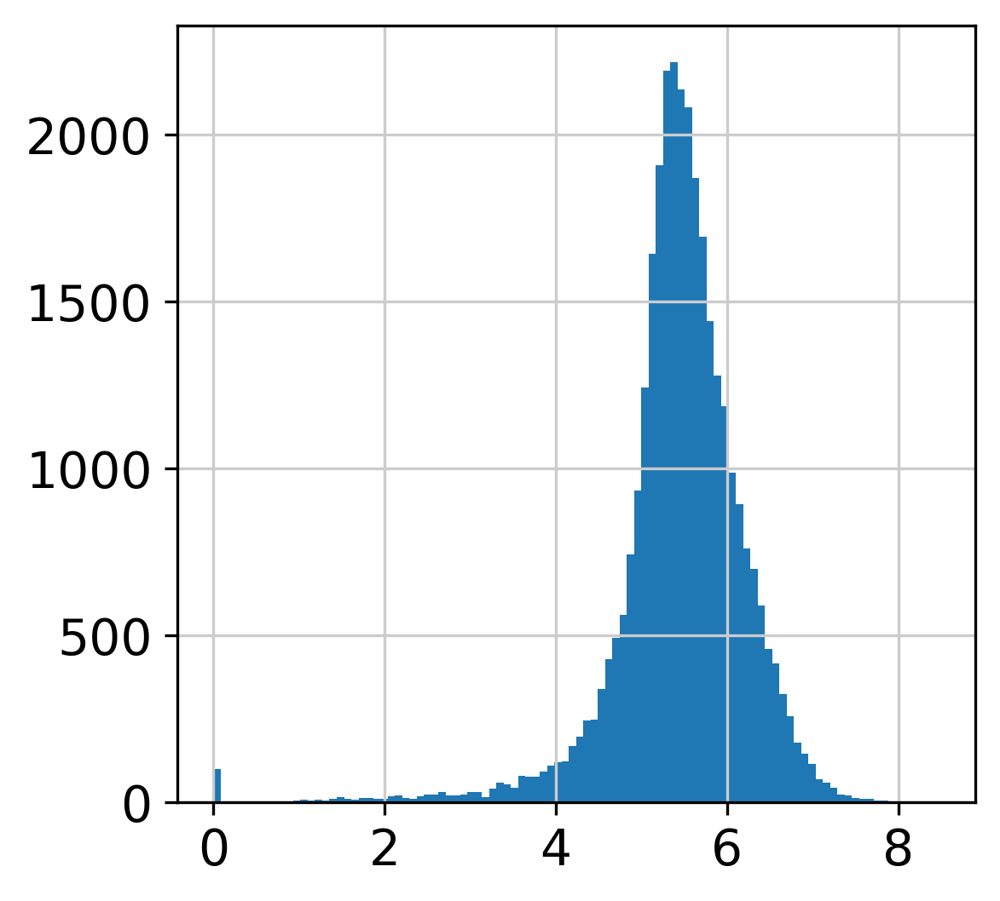

In [17]:
plt.hist(combined_adata.X[:, top_gene_idx].toarray().flatten(), bins=100)
plt.show()

log変換後、しっかりとした分布になっている

### qc ###

In [18]:
# 1. 変動遺伝子を選択 (batch_keyを指定するのがポイント)
sc.pp.highly_variable_genes(combined_adata, batch_key='origin')

# 2. 変動遺伝子だけでデータをサブセット化
adata_pseudo = combined_adata[:, combined_adata.var.highly_variable].copy()

# 3. データをスケール
sc.pp.scale(adata_pseudo, max_value=10)

# 4. PCAを実行
sc.pp.pca(adata_pseudo, n_comps=50)

# 5. 近傍グラフを計算
sc.pp.neighbors(adata_pseudo, n_pcs=30)

# 6. UMAPを計算
sc.tl.umap(adata_pseudo)

extracting highly variable genes
    finished (0:00:03)


/root/.pyenv/versions/3.11.4/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:02:33)
computing neighbors
    using 'X_pca' with n_pcs = 30


2026-02-12 14:33:34.827451: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-12 14:33:34.863600: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-02-12 14:33:35.979686: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


    finished (0:00:33)
computing UMAP
    finished (0:03:54)


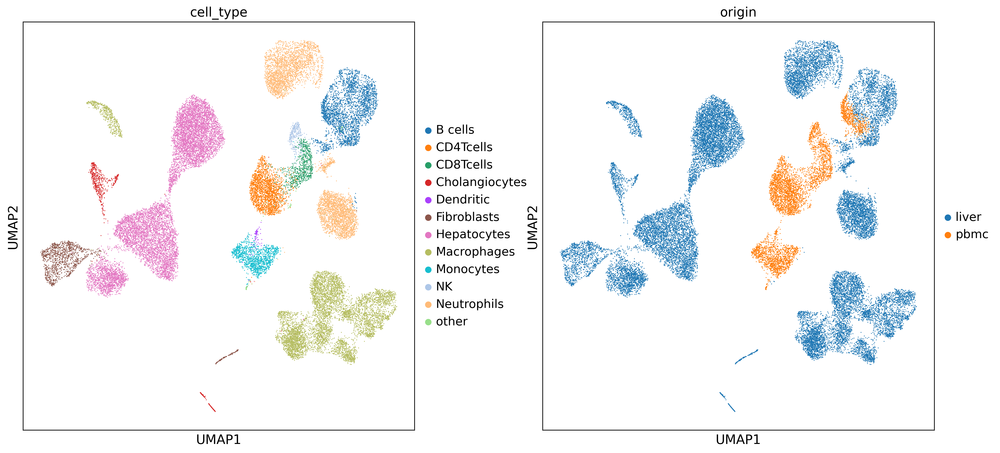

In [19]:
sc.pl.umap(adata_pseudo, color=['cell_type', 'origin'], show=False)
plt.gcf().set_size_inches(18, 8)
plt.show()

In [26]:
import harmonypy as hm
import numpy as np

# 1. Harmonyを実行
ho = hm.run_harmony(adata_pseudo.obsm['X_pca'], adata_pseudo.obs, vars_use=['origin'])

# 2. 補正後のPCAスコアを取得
# 多くの環境では ho.Z_corr.T が正しいですが、今の環境に合わせて変換します
res = np.array(ho.Z_corr)

# もし (50, 32699) の形なら転置し、最初から (32699, 50) ならそのまま使います
if res.shape[0] != adata_pseudo.n_obs:
    res = res.T

# 代入
adata_pseudo.obsm['X_harmony'] = res

# 確認用 (32699, 50) と出れば成功！
print(f"Stored X_harmony shape: {adata_pseudo.obsm['X_harmony'].shape}")

# 3. 以降の処理
sc.pp.neighbors(adata_pseudo, use_rep='X_harmony', n_pcs=30)
sc.tl.umap(adata_pseudo)

2026-02-12 14:41:34,336 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-02-12 14:41:34,336 - harmonypy - INFO -   Parameters:
2026-02-12 14:41:34,336 - harmonypy - INFO -     max_iter_harmony: 10
2026-02-12 14:41:34,336 - harmonypy - INFO -     max_iter_kmeans: 20
2026-02-12 14:41:34,337 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-02-12 14:41:34,337 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-02-12 14:41:34,337 - harmonypy - INFO -     nclust: 100
2026-02-12 14:41:34,337 - harmonypy - INFO -     block_size: 0.05
2026-02-12 14:41:34,337 - harmonypy - INFO -     lamb: [1. 1.]
2026-02-12 14:41:34,338 - harmonypy - INFO -     theta: [2. 2.]
2026-02-12 14:41:34,338 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-02-12 14:41:34,338 - harmonypy - INFO -     verbose: True
2026-02-12 14:41:34,338 - harmonypy - INFO -     random_state: 0
2026-02-12 14:41:34,338 - harmonypy - INFO -   Data: 50 PCs × 32699 cells
2026-02-12 14:41:34,338 - harmonypy - INF

Stored X_harmony shape: (32699, 50)
computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:03:15)


なんかちょっとharmonyの挙動変わった

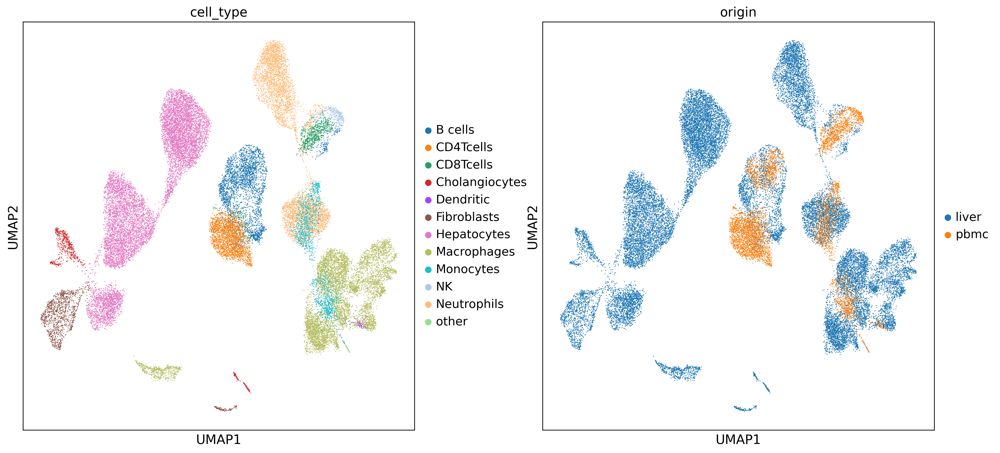

In [27]:
sc.pl.umap(adata_pseudo, color=['cell_type', 'origin'], show=False)
plt.gcf().set_size_inches(18, 8)
plt.show()

harmonyの結果、なんか前回よりBとCD4Tが近い気がする、

### train ###

In [28]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [29]:
combined_adata

AnnData object with n_obs × n_vars = 32699 × 30855
    obs: 'pct_counts_in_top_100_genes', 'log1p_total_counts_ribo', 'log1p_total_counts_mt', 'log1p_total_counts_hb', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mt', 'total_counts_ribo', 'n_genes', 'log1p_total_counts', 'pct_counts_hb', 'cell_type', 'predicted_doublet', 'doublet_score', 'total_counts_hb', 'total_counts', 'n_genes_by_counts', 'pct_counts_in_top_200_genes', 'pct_counts_ribo', 'total_counts_mt', 'log1p_n_genes_by_counts', 'origin'
    var: 'ribo', 'mean_counts', 'total_counts', 'mt', 'hb', 'n_cells', 'n_cells_by_counts', 'log1p_mean_counts', 'log1p_total_counts', 'pct_dropout_by_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'

In [30]:
# 3. 高分散遺伝子（HVG）の抽出
# 全遺伝子で学習すると重すぎる＆ノイズが入るため、通常は上位2000-4000遺伝子に絞ります
sc.pp.highly_variable_genes(
    combined_adata,
    n_top_genes=3000,
    batch_key="origin", # バッチごとに分散を見て選ぶ
    subset=True         # 学習用にサブセット化（全遺伝子戻したい場合は後述の補足参照）
)

extracting highly variable genes
    finished (0:00:02)


以下再度状況確認

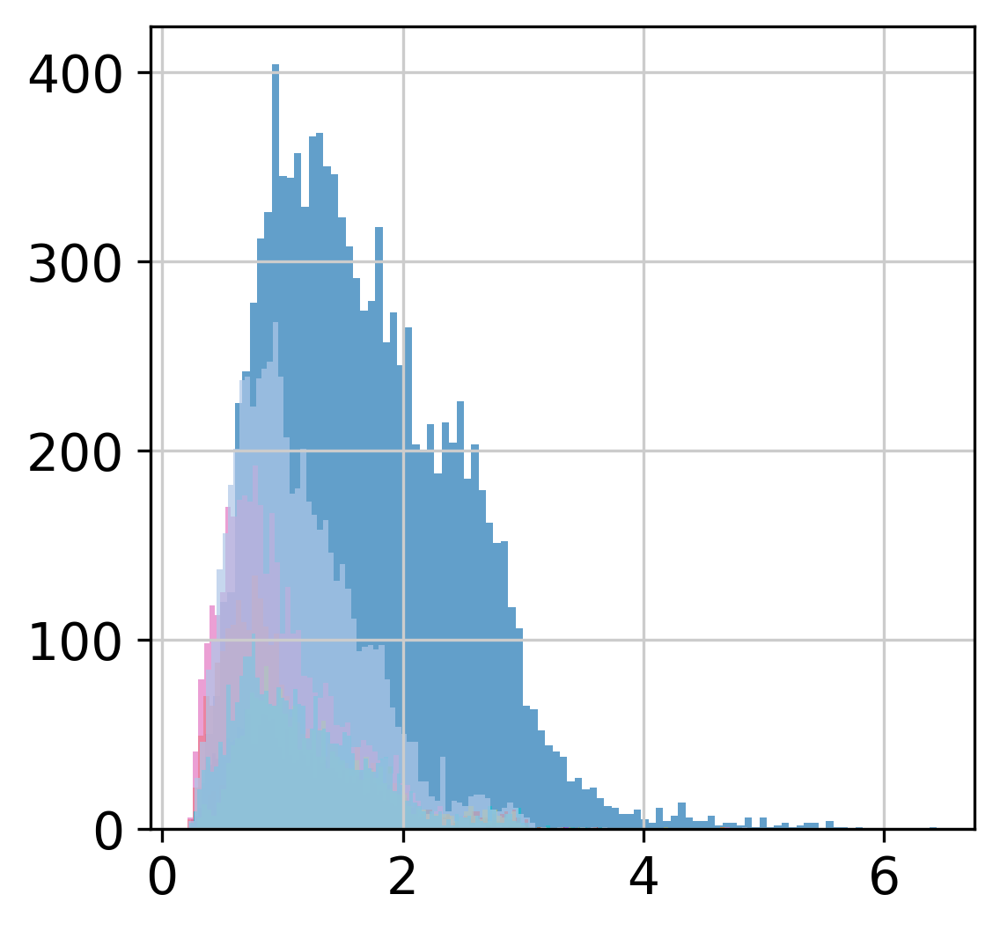

In [42]:
for i in range(10):
    show_data = combined_adata.X[:, i].toarray().flatten()
    show_data = show_data[show_data>0]
    plt.hist(show_data, bins=100, alpha=0.7)
plt.show()

In [45]:
from scvi.external import SysVI

https://github.com/scverse/scvi-tools/blob/main/src/scvi/external/sysvi/_model.py  
を参考

In [46]:
combined_adata

AnnData object with n_obs × n_vars = 32699 × 3000
    obs: 'pct_counts_in_top_100_genes', 'log1p_total_counts_ribo', 'log1p_total_counts_mt', 'log1p_total_counts_hb', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mt', 'total_counts_ribo', 'n_genes', 'log1p_total_counts', 'pct_counts_hb', 'cell_type', 'predicted_doublet', 'doublet_score', 'total_counts_hb', 'total_counts', 'n_genes_by_counts', 'pct_counts_in_top_200_genes', 'pct_counts_ribo', 'total_counts_mt', 'log1p_n_genes_by_counts', 'origin'
    var: 'ribo', 'mean_counts', 'total_counts', 'mt', 'hb', 'n_cells', 'n_cells_by_counts', 'log1p_mean_counts', 'log1p_total_counts', 'pct_dropout_by_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'

In [47]:
# SysVIクラスは定義済みとする

# モデルセットアップ
SysVI.setup_anndata(
    combined_adata,
    batch_key="origin",            # ここに 'Liver' / 'PBMC' の列を指定
    categorical_covariate_keys=[], # もしドナーIDなど他のバッチがあればここに追加
    layer=None                     # .X (log1p正規化済み) を使用
)

# モデル初期化（VampPrior使用）
model = SysVI(
    combined_adata,
    prior="vamp",
    n_prior_components=10
)

# 学習
model.train(
    max_epochs=300,
    early_stopping=True,
    # ▼ GPU設定
    accelerator="gpu",
    devices=1,
    batch_size=4096,  
)

INFO     The model has been initialized                                                                            


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/opt/250102_test_env/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoad

Training:   0%|          | 0/300 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=300` reached.


In [48]:
combined_adata.obs["origin"]

AAACCTGAGCTTTGGT-1-liver    liver
AAAGATGCAAAGGAAG-1-liver    liver
AAAGCAAGTACCGAGA-1-liver    liver
AAAGTAGAGTACGCGA-1-liver    liver
AAATGCCGTCTGCAAT-1-liver    liver
                            ...  
TTTGCATGCACTAG-1-pbmc        pbmc
TTTGCATGCCGAAT-1-pbmc        pbmc
TTTGCATGGAGGTG-1-pbmc        pbmc
TTTGCATGGATAAG-1-pbmc        pbmc
TTTGCATGGGCATT-1-pbmc        pbmc
Name: origin, Length: 32699, dtype: category
Categories (2, object): ['liver', 'pbmc']

In [49]:
from scvi import REGISTRY_KEYS

def get_sysvi_corrected_robust(model, adata, target_batch_name, layer_name="counts"):
    """
    SysVIモデルのEncoder/Decoderを直接呼び出して補正を行う関数 (V5: Direct Bypass)
    """
    # 1. モデルを評価モードへ
    module = model.module
    module.eval()
    device = list(module.parameters())[0].device # moduleはdeviceを持たないため最初のパラメータの場所を取得
    
    # 2. 入力データ (X) の作成
    if layer_name in adata.layers:
        x_data = adata.layers[layer_name]
    elif layer_name == "X":
        x_data = adata.X
    else:
        x_data = adata.X
        
    if hasattr(x_data, "toarray"): # スパースな行列に対する処理
        x_data = x_data.toarray()
    
    # PyTorchテンソル化
    x_tensor = torch.from_numpy(x_data).float().to(device)
    n_obs = x_tensor.shape[0]
    
    # 3. バッチID (batch_index) の作成
    # 学習時の0, 1みたいなバッチとliver, pbmcのようなバッチラベルを揃える
    registry = model.adata_manager.get_state_registry(REGISTRY_KEYS.BATCH_KEY)
    mapping = registry.categorical_mapping
    
    batch_series = adata.obs[registry.original_key].astype("category")
    batch_series = batch_series.cat.set_categories(mapping)
    real_batch_indices = torch.from_numpy(batch_series.cat.codes.values).long().to(device).unsqueeze(1)
    
    # 4. ターゲットバッチID の作成
    try:
        target_id = np.where(mapping == target_batch_name)[0][0]
    except IndexError:
        raise ValueError(f"バッチ '{target_batch_name}' が見つかりません。登録バッチ: {mapping}")
    
    target_batch_indices = torch.full((n_obs, 1), target_id, device=device).long()
    
    # 5. 推論と生成 (ラッパー関数をバイパスして直接実行)
    with torch.no_grad():
        # === Step A: Encoder ===
        # module.encoder は EncoderDecoder クラスのインスタンスです
        # ここに直接、必要な引数を渡します
        # cat_list は必ず「リスト」である必要があります。空なら [] です。
        encoder_outputs = module.encoder(
            x=x_tensor,
            batch_index=real_batch_indices,
            cat_list=[],  # 空リスト (Noneはダメ)
            cont=None     # 連続変数は None
        )
        
        # 潜在変数 z 
        # (分布そのものではなくoutputs["q_dist"].rsample()で分布から得られたノイズ込みのサンプリングデータ)
        # (平均にしたいようであればz = encoder_outputs["q_dist"].mean)
        # 正直学習じゃないのでencoder_outputs["q_dist"].meanでもいいかも
        # sample=Trueの部分を変えての変更も可能
        z = encoder_outputs["q"]
        
        # === Step B: Decoder ===
        # module.decoder も EncoderDecoder クラスのインスタンスです
        # ターゲットのバッチIDを渡して復元します
        decoder_outputs = module.decoder(
            x=z,
            batch_index=target_batch_indices,
            cat_list=[],  # 空リスト
            cont=None     # None
        )
        
        # 値の取り出し
        # Decoderの出力は通常 "q_dist" (分布) または "q" (値) などが含まれます
        if "q_dist" in decoder_outputs: # とりあえずは分布を取り出し、その平均を補正済みの発現量とする
            dist = decoder_outputs["q_dist"]
            if hasattr(dist, "mean"):
                corrected_values = dist.mean.cpu().numpy()
            else:
                corrected_values = dist.cpu().numpy()

        elif "q" in decoder_outputs: # 上手くいかないときのため、outputs["q_dist"].rsample()を入れておく
            corrected_values = decoder_outputs["q"].cpu().numpy()
            
        else:
             raise KeyError(f"出力キーが見つかりません: {decoder_outputs.keys()}")

    # 6. DataFrame化
    corrected_df = pd.DataFrame(
        corrected_values,
        index=adata.obs_names,
        columns=adata.var_names
    )
    
    return corrected_df

https://github.com/scverse/scvi-tools/blob/main/src/scvi/external/sysvi/_module.py  
を参考

In [50]:
# === 実行 ===
# 全員を "liver" の条件に合わせて補正
corrected_df = get_sysvi_corrected_robust(
    model, 
    combined_adata, 
    target_batch_name="liver", 
    layer_name="X"
)

/tmp/ipykernel_1764014/1294852798.py:34: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  real_batch_indices = torch.from_numpy(batch_series.cat.codes.values).long().to(device).unsqueeze(1)


In [51]:
corrected_df.head()

,7SK.2,AAGAB,AATK,ABCA7,ABCC12,ABCC4,ABCD4,ABCG1,ABHD17A,ABHD3,...,ZNF747,ZNF792,ZNF80,ZNF800,ZNF845,ZNF883,ZNF93,ZNFX1,ZSCAN18,hsa-mir-1199
AAACCTGAGCTTTGGT-1-liver,0.143793,0.031702,0.009713,0.019102,-0.000090,-0.001888,0.107601,0.073510,0.077517,0.022891,...,0.017226,-0.004694,0.004765,0.084050,0.009976,0.001872,0.021860,0.019054,0.122532,0.010429
AAAGATGCAAAGGAAG-1-liver,0.032779,0.045763,0.006924,0.015586,0.000251,0.009810,0.106761,0.109681,0.094604,0.036681,...,0.018613,-0.003984,0.008466,0.070362,0.010775,0.000812,0.016487,0.032010,0.111791,0.013129
AAAGCAAGTACCGAGA-1-liver,0.152752,0.032765,0.006462,0.021888,0.002018,-0.004787,0.078142,0.082317,0.139911,0.033381,...,0.017980,-0.004661,0.005268,0.088336,-0.001288,0.002167,0.005966,0.063141,0.076086,0.012392
AAAGTAGAGTACGCGA-1-liver,0.561985,0.043881,0.009888,0.034882,0.001896,0.018152,0.112920,0.148698,0.173147,0.078236,...,0.024045,0.003826,0.003335,0.196102,0.017569,0.007310,0.015997,0.089021,0.068775,0.009449
AAATGCCGTCTGCAAT-1-liver,0.249196,0.035171,0.007961,0.027231,-0.000171,0.014341,0.115542,0.130118,0.173658,0.075790,...,0.017583,0.002803,0.002445,0.140096,0.010285,0.008789,0.018998,0.069770,0.044136,0.010149


In [52]:
adata_corrected = combined_adata[:, combined_adata.var.highly_variable].copy()

In [53]:
adata_corrected.X = corrected_df.values

In [56]:
print(type(adata_corrected.X))

<class 'numpy.ndarray'>


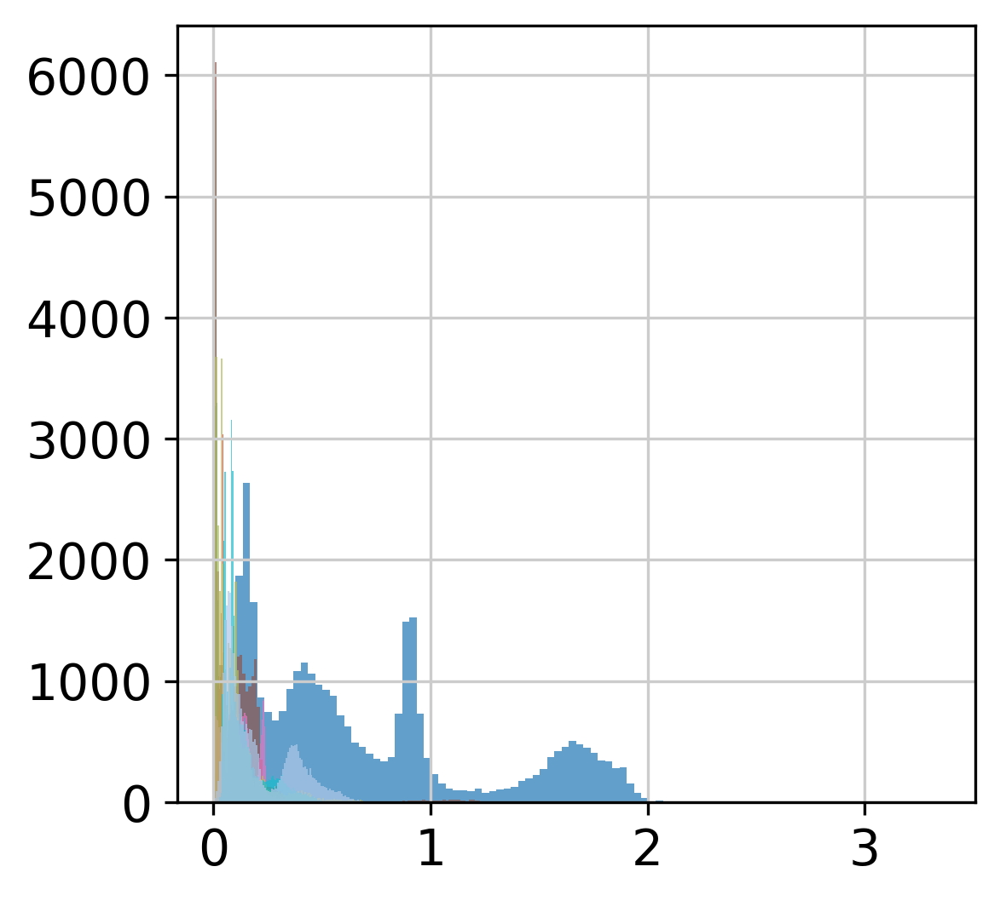

In [58]:
# 密行列なので.toarray().flatten()は不要
for i in range(10):
    show_data = adata_corrected.X[:, i]
    show_data = show_data[show_data>0]
    plt.hist(show_data, bins=100, alpha=0.7)
plt.show()

In [59]:
adata_corrected

AnnData object with n_obs × n_vars = 32699 × 3000
    obs: 'pct_counts_in_top_100_genes', 'log1p_total_counts_ribo', 'log1p_total_counts_mt', 'log1p_total_counts_hb', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mt', 'total_counts_ribo', 'n_genes', 'log1p_total_counts', 'pct_counts_hb', 'cell_type', 'predicted_doublet', 'doublet_score', 'total_counts_hb', 'total_counts', 'n_genes_by_counts', 'pct_counts_in_top_200_genes', 'pct_counts_ribo', 'total_counts_mt', 'log1p_n_genes_by_counts', 'origin', '_scvi_batch'
    var: 'ribo', 'mean_counts', 'total_counts', 'mt', 'hb', 'n_cells', 'n_cells_by_counts', 'log1p_mean_counts', 'log1p_total_counts', 'pct_dropout_by_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid'

In [60]:
# 3. データをスケール
sc.pp.scale(adata_corrected, max_value=10)

# 4. PCAを実行
sc.pp.pca(adata_corrected, n_comps=50)

# 5. 近傍グラフを計算
sc.pp.neighbors(adata_corrected, n_pcs=30)

# 6. UMAPを計算
sc.tl.umap(adata_corrected)

computing PCA
    with n_comps=50
    finished (0:00:50)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:02)
computing UMAP
    finished (0:04:04)


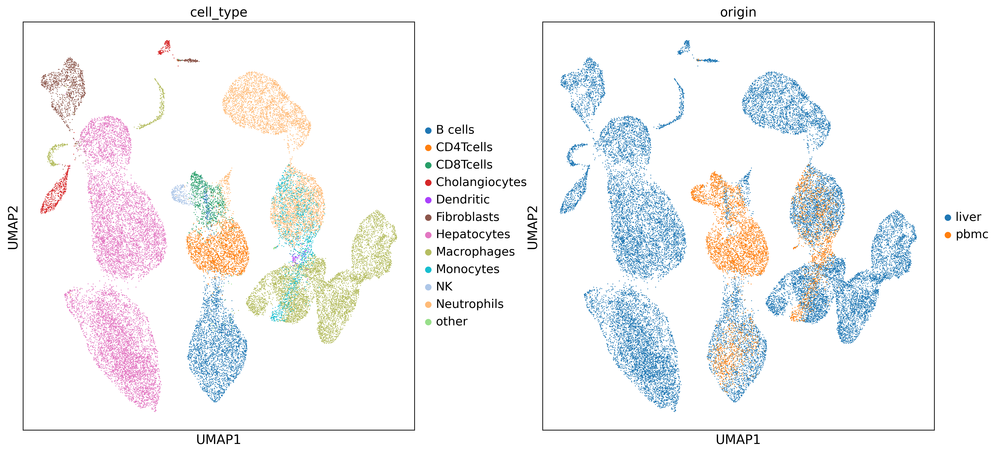

In [61]:
sc.pl.umap(adata_corrected, color=['cell_type', 'origin'], show=False)
plt.gcf().set_size_inches(18, 8)
plt.show()

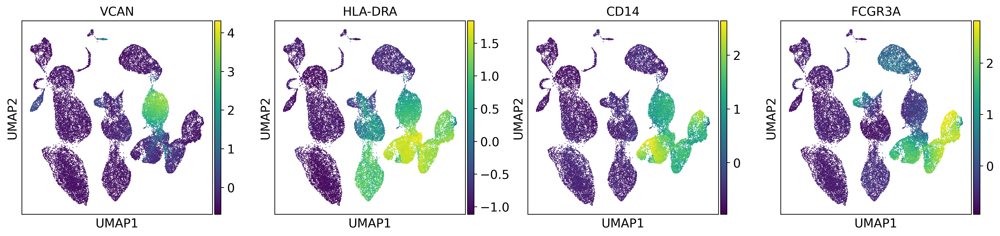

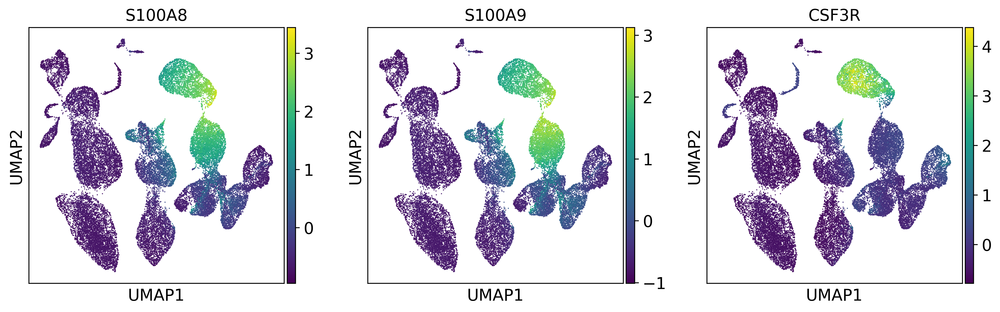

In [62]:
marker_dict = {
    "Mo/Mac": ["VCAN", "HLA-DRA", "CD14", "FCGR3A"],
    "Neu": ["S100A8", "S100A9", "CSF3R"],
}

for k in marker_dict:
    sc.pl.umap(adata_corrected, color=marker_dict[k])

In [64]:
adata_corrected

AnnData object with n_obs × n_vars = 32699 × 3000
    obs: 'pct_counts_in_top_100_genes', 'log1p_total_counts_ribo', 'log1p_total_counts_mt', 'log1p_total_counts_hb', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mt', 'total_counts_ribo', 'n_genes', 'log1p_total_counts', 'pct_counts_hb', 'cell_type', 'predicted_doublet', 'doublet_score', 'total_counts_hb', 'total_counts', 'n_genes_by_counts', 'pct_counts_in_top_200_genes', 'pct_counts_ribo', 'total_counts_mt', 'log1p_n_genes_by_counts', 'origin', '_scvi_batch'
    var: 'ribo', 'mean_counts', 'total_counts', 'mt', 'hb', 'n_cells', 'n_cells_by_counts', 'log1p_mean_counts', 'log1p_total_counts', 'pct_dropout_by_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'pca', 'neighbors', 'umap', 'cell_type_colors', 'origin_colors'
    obsm: 'X_pca', 'X_umap'
    var

In [65]:
# データ保存
adata_corrected.write("/workspace/260212_sysvi_fix/result/result_32699x3000.h5ad")